In [47]:
from keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions
from keras.preprocessing import image
import keras.backend as K
import numpy as np
import cv2
import sys
import requests
import os
import matplotlib.pyplot as plt
from io import BytesIO
from PIL import Image
%matplotlib inline

In [48]:
#Function extracts .png images path from given directory
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        if filename.endswith(".png"):
        #   img = image.load_img('images/'+filename, target_size=(224, 224))
        #   img= cv2.resize((224,224))
        #   img = cv2.imread(os.path.join(folder, filename))
        #   if img is not None:
                images.append(folder+'/'+filename)
    return images


#show the images as columns wise, by default columns is 1, required images is numpy array
def show_images(images, cols = 1, titles = None):
    """Display a list of images(numpy array) in a single figure with matplotlib.
    
    Parameters
    ---------
    images: List of np.arrays compatible with plt.imshow.
    
    cols (Default = 1): Number of columns in figure (number of rows is 
                        set to np.ceil(n_images/float(cols))).
    
    titles: List of titles corresponding to each image. Must have
            the same length as titles.
    """
    assert((titles is None)or (len(images) == len(titles)))
    n_images = len(images)
    if titles is None: titles = ['Image (%d)' % i for i in range(1,n_images + 1)]
    fig = plt.figure()
    for n, (image, title) in enumerate(zip(images, titles)):
        a = fig.add_subplot(cols, np.ceil(n_images/float(cols)), n + 1)
        if image.ndim == 2:
            plt.gray()
        plt.imshow(image)
        a.set_title(title)
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    plt.show()
    
#images path 
def superimposed_images(img_path, model):
#     img_path = 'images/airplane.png'
    img = image.load_img(img_path, target_size=(32, 32))

    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    
    preds = model.predict(x)
    class_idx = np.argmax(preds[0])
    class_output = model.output[:, class_idx]
    last_conv_layer = model.get_layer("activation_34")#change layer according to model
    
    grads = K.gradients(class_output, last_conv_layer.output)[0]
    pooled_grads = K.mean(grads, axis=(0, 1, 2))
    iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
    pooled_grads_value, conv_layer_output_value = iterate([x])
    for i in range(9):
        conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    
    heatmap = np.mean(conv_layer_output_value, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    
    img = cv2.imread(img_path)
    # img = Image.open(BytesIO(response.content))
    # img = img.resize((224, 224))

    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    return superimposed_img
    


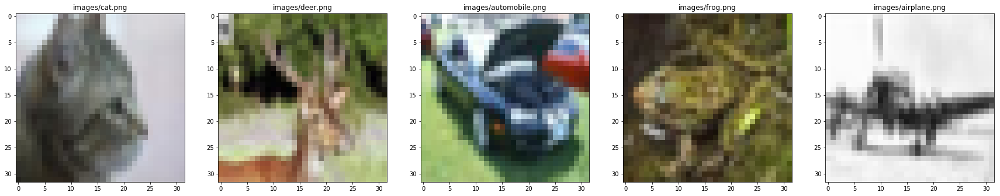

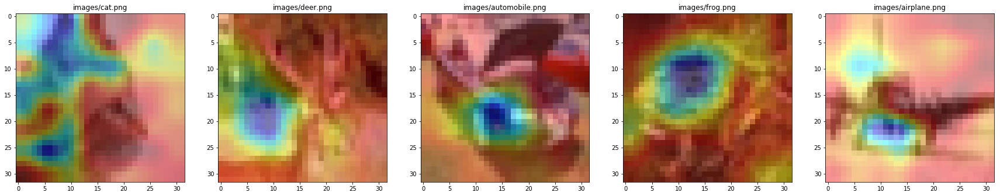

In [49]:
from keras.models import load_model
# model = load_model('EVAassgn9.hdf5')
model = VGG16(weights="imagenet")


# argument takes folder path and loaded model
def show_img_with_gradCAM(path, model):
    imges = load_images_from_folder(path)
    titles = imges[:5]
    clases = [cv2.imread(img) for img in imges][:5]
    kk = [superimposed_images(img, model) for img in imges][:5]
    show_images(clases,  titles = titles)
    show_images(kk,  titles = titles)
    
show_img_with_gradCAM(path ='images', model = model)

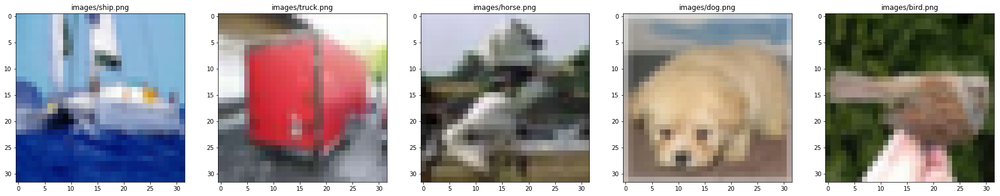

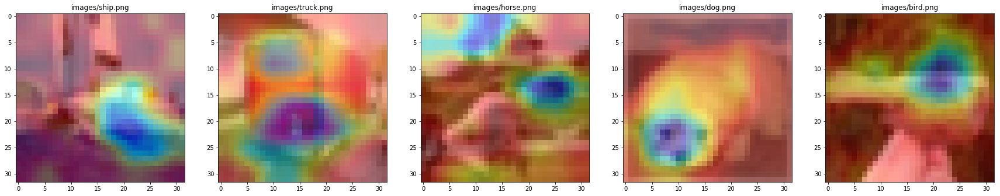

In [50]:
def show_img_with_gradCAM(path, model):
    imges = load_images_from_folder(path)
    titles = imges[5:]
    clases = [cv2.imread(img) for img in imges][5:]
    kk = [superimposed_images(img, model) for img in imges][5:]
    show_images(clases,  titles = titles)
    show_images(kk,  titles = titles)
    
show_img_with_gradCAM(path ='images', model = model)

# VGG16 imagenet weights visualization for each class activation

In [1]:
from keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions
from keras.preprocessing import image
import keras.backend as K
import numpy as np
import cv2
import sys
import requests
import os
import urllib
import matplotlib.pyplot as plt
from io import BytesIO
from PIL import Image
%matplotlib inline

Using TensorFlow backend.


In [2]:
#Function extracts .png images path from given directory
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        if filename.endswith(".png"):
        #   img = image.load_img('images/'+filename, target_size=(224, 224))
        #   img= cv2.resize((224,224))
        #   img = cv2.imread(os.path.join(folder, filename))
        #   if img is not None:
                images.append(folder+'/'+filename)
    return images


#show the images as columns wise, by default columns is 1, required images is numpy array
def show_images(images, cols = 1, titles = None):
    """Display a list of images(numpy array) in a single figure with matplotlib.
    
    Parameters
    ---------
    images: List of np.arrays compatible with plt.imshow.
    
    cols (Default = 1): Number of columns in figure (number of rows is 
                        set to np.ceil(n_images/float(cols))).
    
    titles: List of titles corresponding to each image. Must have
            the same length as titles.
    """
    assert((titles is None)or (len(images) == len(titles)))
    n_images = len(images)
    if titles is None: titles = ['Image (%d)' % i for i in range(1,n_images + 1)]
    fig = plt.figure()
    for n, (image, title) in enumerate(zip(images, titles)):
        a = fig.add_subplot(cols, np.ceil(n_images/float(cols)), n + 1)
        if image.ndim == 2:
            plt.gray()
        plt.imshow(image)
        a.set_title(title)
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    plt.show()
    
#images path 
def superimposed_images(img_path, model):
    img_path = '16_scale_tony_stark_avenger3_headscrupt_with_glasses_1534759826_e79b0cf4.webp'
    img = image.load_img(img_path, target_size=(224, 224))

    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    
    preds = model.predict(x)
    class_idx = np.argmax(preds[0])
    class_output = model.output[:, class_idx]
    last_conv_layer = model.get_layer("block5_conv3")#change layer according to model
    
    grads = K.gradients(class_output, last_conv_layer.output)[0]
    pooled_grads = K.mean(grads, axis=(0, 1, 2))
    iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
    pooled_grads_value, conv_layer_output_value = iterate([x])
    for i in range(512):
        conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    
    heatmap = np.mean(conv_layer_output_value, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    
    img = cv2.imread(img_path)
#     img = Image.open(BytesIO(response.content))
#     img = img.resize((224, 224))

    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    return superimposed_img
    


In [3]:
model = VGG16(weights="imagenet")


In [53]:
# url = 'https://gss1.bdstatic.com/-vo3dSag_xI4khGkpoWK1HF6hhy/baike/c0%3Dbaike80%2C5%2C5%2C80%2C26/sign=468864cdf0039245b5b8e95de6fdcfa7/54fbb2fb43166d22ca0c87944a2309f79052d2b3.jpg'
# Image.open(urllib.request.urlopen(url))


In [49]:
# path = '16_scale_tony_stark_avenger3_headscrupt_with_glasses_1534759826_e79b0cf4.jpeg'
# show_images([path])

In [47]:
resp.read()

b''

In [6]:
# cv2.imshow(image)
path = '16_scale_tony_stark_avenger3_headscrupt_with_glasses_1534759826_e79b0cf4.webp'

In [7]:
img = image.load_img(path, target_size=(224, 224))

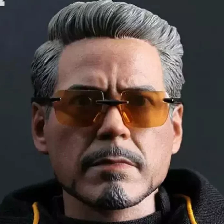

In [8]:
img

In [9]:
from keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions
from keras.preprocessing import image
import keras.backend as K
import numpy as np
import cv2
import sys

In [10]:
odel = VGG16(weights="imagenet")
img_path = '16_scale_tony_stark_avenger3_headscrupt_with_glasses_1534759826_e79b0cf4.webp'
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

In [13]:
preds = model.predict(x)
# for i in 
class_idx = np.argmax(preds[0])
class_output = model.output[:, class_idx]
last_conv_layer = model.get_layer("block5_conv3")

In [16]:
# class_idx 837

In [17]:
grads = K.gradients(class_output, last_conv_layer.output)[0]
pooled_grads = K.mean(grads, axis=(0, 1, 2))
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
pooled_grads_value, conv_layer_output_value = iterate([x])
for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

In [18]:
heatmap = np.mean(conv_layer_output_value, axis=-1)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)

In [19]:
img = cv2.imread(img_path)
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

# Highest class activation

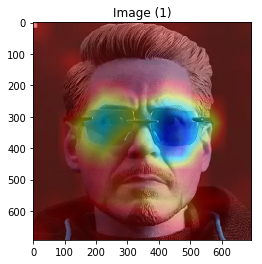

In [21]:
show_images([superimposed_images(path, model)])

In [58]:
def superimposed_images(img_path, model):
    img_path = '16_scale_tony_stark_avenger3_headscrupt_with_glasses_1534759826_e79b0cf4.webp'
    img = image.load_img(img_path, target_size=(224, 224))

    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    
    preds = model.predict(x)
    #starting index
    layer = 800
#     class_idx = np.argmax(preds[0])
    kk = []
    ind = []
    for index ,lp in enumerate(preds[0]):
        class_output = model.output[:, index+layer]
        last_conv_layer = model.get_layer("block5_conv3")#change layer according to model

        grads = K.gradients(class_output, last_conv_layer.output)[0]
        pooled_grads = K.mean(grads, axis=(0, 1, 2))
        iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
        pooled_grads_value, conv_layer_output_value = iterate([x])
        for i in range(512):
            conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

        heatmap = np.mean(conv_layer_output_value, axis=-1)
        heatmap = np.maximum(heatmap, 0)
        heatmap /= np.max(heatmap)

        img = cv2.imread(img_path)

        heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
        heatmap = np.uint8(255 * heatmap)

        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
        superimposed_img = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

        kk.append(superimposed_img)
        ind.append(index+1+layer)
        if (index+1+layer)%5==0:
            show_images(kk,1,titles=ind)
            kk = []
            ind = []
        if index+layer==999:  
            break
    


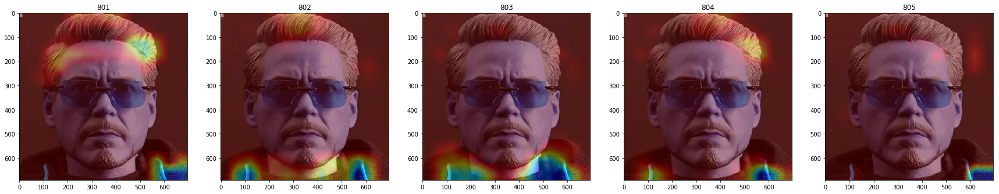

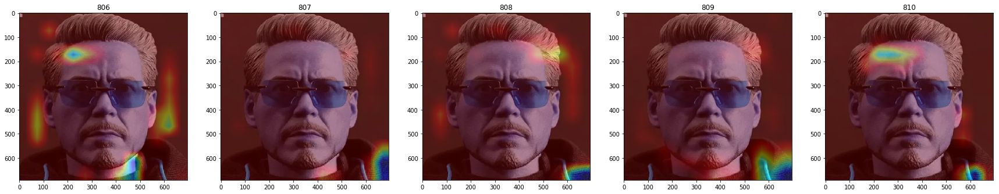

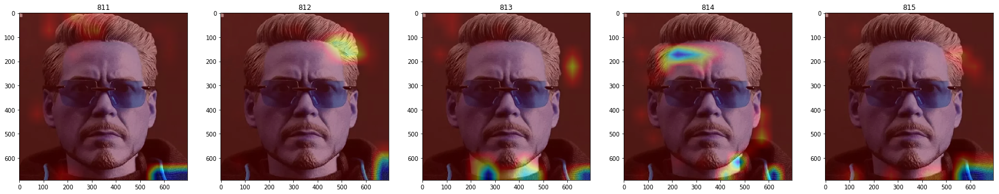

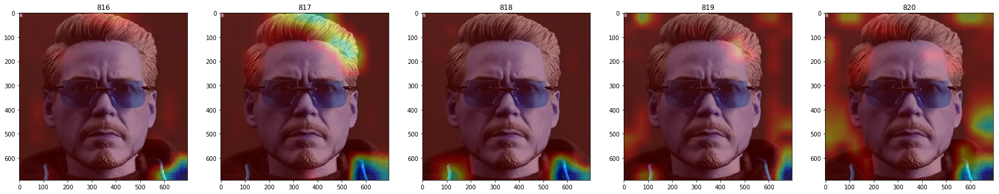

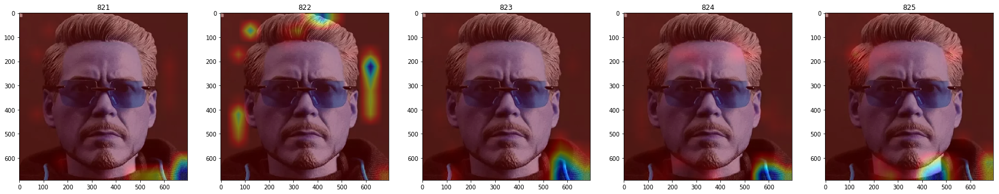

...

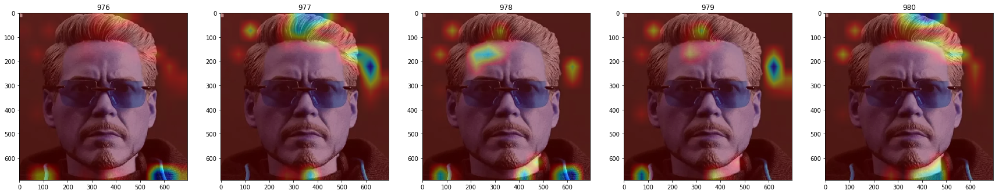

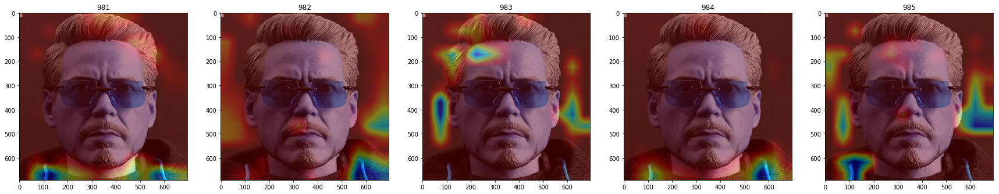

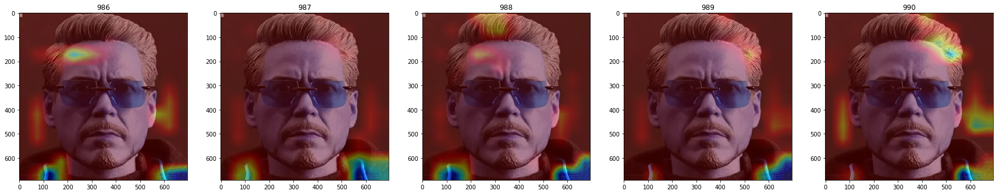

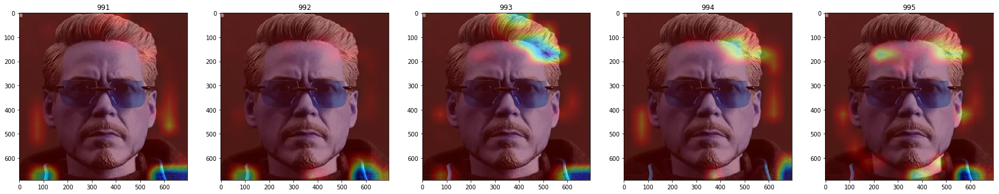

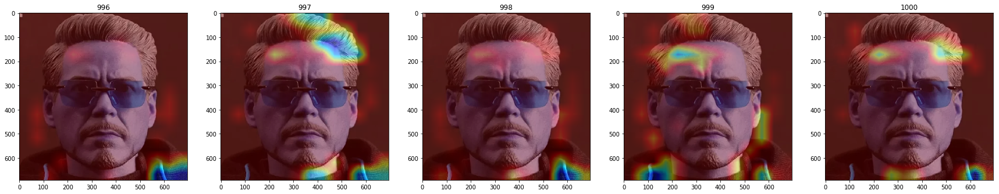

In [59]:
superimposed_images(path, model)